# End to End Process Mining Implementation: The Pythonic Way
## Library Imports

In [289]:
# import required libraries in PM4Py
import pm4py


from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.statistics.traces.generic.log import case_statistics

from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.statistics.traces.generic.log import case_statistics
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.objects.petri_net.importer import importer as pnml_importer
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization



# Other python libraries required for EDA
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import math

## Reading the Event Data for EDA

In [290]:
# Reading the data to begin the analysis. Reading the event log in XES and then converting to dataframe

event_log_xes = pm4py.read_xes('BPI_Challenge_2012.xes')

event_log_df = pm4py.convert_to_dataframe(event_log_xes)


parsing log, completed traces ::   0%|          | 0/13087 [00:00<?, ?it/s]

In [291]:
# In this step I will first change the dutch activity names to english in a data frame and convert back the dataframe to xes format

event_log_df['concept:name'] = event_log_df['concept:name'].replace(['W_Completeren aanvraag','W_Nabellen offertes','W_Valideren aanvraag','W_Wijzigen contractgegevens','W_Afhandelen leads', 'W_Nabellen incomplete dossiers','W_Beoordelen fraude'],['W_Filling in information for the application','W_Calling after sent offers','W_Assessing the application','W_Change contract details','W_Fixing incoming lead','W_Calling to add missing information to the application','W_Assess fraud'])
event_log_df




,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
3,112,SCHEDULE,W_Filling in information for the application,2011-10-01 00:39:38.875000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
4,NaN,START,W_Filling in information for the application,2011-10-01 11:36:46.437000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
...,...,...,...,...,...,...,...
262195,112,COMPLETE,A_PARTLYSUBMITTED,2012-02-29 23:51:17.423000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000
262196,112,SCHEDULE,W_Fixing incoming lead,2012-02-29 23:52:01.287000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000
262197,11169,START,W_Fixing incoming lead,2012-03-01 09:26:46.736000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000
262198,11169,COMPLETE,A_DECLINED,2012-03-01 09:27:37.118000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000


In [292]:
# Converting the dataframe back to event log with the translated english acitivty names
event_log_xes = pm4py.convert_to_event_log(event_log_df)

## EDA techniques using PM4Py library

In [293]:
# Viewing the first trace in the event log
event_log_xes[0]
# len(event_log_xes[0])

{'attributes': {'REG_DATE': Timestamp('2011-10-01 00:38:44.546000+0200', tz='UTC+02:00'), 'concept:name': '173688', 'AMOUNT_REQ': '20000'}, 'events': [{'org:resource': '112', 'lifecycle:transition': 'COMPLETE', 'concept:name': 'A_SUBMITTED', 'time:timestamp': Timestamp('2011-10-01 00:38:44.546000+0200', tz='UTC+02:00')}, '..', {'org:resource': '10629', 'lifecycle:transition': 'COMPLETE', 'concept:name': 'W_Assessing the application', 'time:timestamp': Timestamp('2011-10-13 10:37:37.026000+0200', tz='UTC+02:00')}]}

In [294]:
# Viewing the first event in the first trace of the event log

event_log_xes[0][0]

{'org:resource': '112', 'lifecycle:transition': 'COMPLETE', 'concept:name': 'A_SUBMITTED', 'time:timestamp': Timestamp('2011-10-01 00:38:44.546000+0200', tz='UTC+02:00')}

In [295]:
# Counting the number of events in the event log
len(event_log_xes)

13087

In [296]:
# Fetching the start ectivities
start_activities = pm4py.get_start_activities(event_log_xes)
start_activities

{'A_SUBMITTED': 13087}

In [297]:
# Fetching the end ectivities
end_activities = pm4py.get_end_activities(event_log_xes)
end_activities
# filter_activities = pm4py.filter_end_activities(event_log_xes, ['O_CANCELLED'])
# filter_activities

{'W_Assessing the application': 2747,
 'W_Change contract details': 4,
 'A_DECLINED': 3429,
 'W_Filling in information for the application': 1939,
 'A_CANCELLED': 655,
 'W_Calling to add missing information to the application': 452,
 'W_Fixing incoming lead': 2234,
 'W_Calling after sent offers': 1290,
 'W_Assess fraud': 57,
 'O_CANCELLED': 279,
 'A_REGISTERED': 1}

In [298]:
# Retrieving the number of activities in the event log

event_activities = pm4py.get_event_attribute_values(event_log_xes, 'concept:name')
event_activities

{'A_SUBMITTED': 13087,
 'A_PARTLYSUBMITTED': 13087,
 'A_PREACCEPTED': 7367,
 'W_Filling in information for the application': 54850,
 'A_ACCEPTED': 5113,
 'O_SELECTED': 7030,
 'A_FINALIZED': 5015,
 'O_CREATED': 7030,
 'O_SENT': 7030,
 'W_Calling after sent offers': 52016,
 'O_SENT_BACK': 3454,
 'W_Assessing the application': 20809,
 'A_REGISTERED': 2246,
 'A_APPROVED': 2246,
 'O_ACCEPTED': 2243,
 'A_ACTIVATED': 2246,
 'O_CANCELLED': 3655,
 'W_Change contract details': 12,
 'A_DECLINED': 7635,
 'A_CANCELLED': 2807,
 'W_Fixing incoming lead': 16566,
 'O_DECLINED': 802,
 'W_Calling to add missing information to the application': 25190,
 'W_Assess fraud': 664}

## EDA techniques using Pandas Library

In [299]:
# checking the dataframe
event_log_df.head(30)

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
3,112,SCHEDULE,W_Filling in information for the application,2011-10-01 00:39:38.875000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
4,NaN,START,W_Filling in information for the application,2011-10-01 11:36:46.437000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
5,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
7,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000


In [300]:
event_log_df.shape

(262200, 7)

In [301]:
#checking for any null value

event_log_df.isnull().sum()

org:resource            18010
lifecycle:transition        0
concept:name                0
time:timestamp              0
case:REG_DATE               0
case:concept:name           0
case:AMOUNT_REQ             0
dtype: int64

In [302]:
event_log_df.dtypes

org:resource            object
lifecycle:transition    object
concept:name            object
time:timestamp          object
case:REG_DATE           object
case:concept:name       object
case:AMOUNT_REQ         object
dtype: object

In [303]:
event_log_df.describe()

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
count,244190,262200,262200,262200,262200,262200,262200
unique,68,3,24,248189,13087,13087,631
top,112,COMPLETE,W_Filling in information for the application,2011-11-16 12:54:02.245000+01:00,2011-11-15 13:42:45.592000+01:00,185548,5000
freq,45687,164506,54850,4,175,175,32988


In [305]:
# Fininding the list of events form the df

df_events = event_log_df['concept:name'].unique()
df_events

array(['A_SUBMITTED', 'A_PARTLYSUBMITTED', 'A_PREACCEPTED',
       'W_Filling in information for the application', 'A_ACCEPTED',
       'O_SELECTED', 'A_FINALIZED', 'O_CREATED', 'O_SENT',
       'W_Calling after sent offers', 'O_SENT_BACK',
       'W_Assessing the application', 'A_REGISTERED', 'A_APPROVED',
       'O_ACCEPTED', 'A_ACTIVATED', 'O_CANCELLED',
       'W_Change contract details', 'A_DECLINED', 'A_CANCELLED',
       'W_Fixing incoming lead', 'O_DECLINED',
       'W_Calling to add missing information to the application',
       'W_Assess fraud'], dtype=object)

In [306]:
# Fetching the start activity using df

start_activities_df = pm4py.get_start_activities(event_log_df)
start_activities_df = pd.DataFrame.from_dict(start_activities_df,orient='index',columns=['Count'])
start_activities_df

,Count
A_SUBMITTED,13087


In [307]:
# Fetching the end activity using df

end_activities_df = pm4py.get_end_activities(event_log_df)
end_activities_df = pd.DataFrame.from_dict(end_activities_df,orient='index',columns=['Count'])
end_activities_df

,Count
A_DECLINED,3429
W_Assessing the application,2747
W_Fixing incoming lead,2234
W_Filling in information for the application,1939
W_Calling after sent offers,1290
A_CANCELLED,655
W_Calling to add missing information to the application,452
O_CANCELLED,279
W_Assess fraud,57
W_Change contract details,4


In [308]:
# Fetching the count of activities using df

activity_df = pm4py.get_event_attribute_values(event_log_df, 'concept:name')
activity_df

{'W_Filling in information for the application': 54850,
 'W_Calling after sent offers': 52016,
 'W_Calling to add missing information to the application': 25190,
 'W_Assessing the application': 20809,
 'W_Fixing incoming lead': 16566,
 'A_PARTLYSUBMITTED': 13087,
 'A_SUBMITTED': 13087,
 'A_DECLINED': 7635,
 'A_PREACCEPTED': 7367,
 'O_SELECTED': 7030,
 'O_CREATED': 7030,
 'O_SENT': 7030,
 'A_ACCEPTED': 5113,
 'A_FINALIZED': 5015,
 'O_CANCELLED': 3655,
 'O_SENT_BACK': 3454,
 'A_CANCELLED': 2807,
 'A_APPROVED': 2246,
 'A_REGISTERED': 2246,
 'A_ACTIVATED': 2246,
 'O_ACCEPTED': 2243,
 'O_DECLINED': 802,
 'W_Assess fraud': 664,
 'W_Change contract details': 12}

In [309]:
# splitting the df to application status only

application_status = ['A_ACCEPTED','A_ACTIVATED','A_APPROVED','A_CANCELLED','A_DECLINED','A_FINALIZED','A_PARTLYSUBMITTED','A_PREACCEPTED','A_REGISTERED','A_SUBMITTED']
offer_status = ['O_ACCEPTED' , 'O_CANCELLED', 'O_CREATED','O_DECLINED' , 'O_SELECTED', 'O_SENT', 'O_SENT_BACK']
workitem_status = ['W_Fixing incoming lead' , 'W_Assess fraud','W_Filling in information for the application','W_Calling to add missing information to the application','W_Calling after sent offers','W_Assessing the application','W_Change contract details']

app_status_df = event_log_df[event_log_df['concept:name'].isin(application_status)]
offer_status_df = event_log_df[event_log_df['concept:name'].isin(offer_status)]
workitem_staus_df = event_log_df[event_log_df['concept:name'].isin(workitem_status)]


In [310]:
app_status_df

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
5,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
7,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
...,...,...,...,...,...,...,...
262185,10933,COMPLETE,A_ACCEPTED,2012-03-01 20:17:22.457000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500
262187,10933,COMPLETE,A_FINALIZED,2012-03-01 20:22:38.593000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500
262194,112,COMPLETE,A_SUBMITTED,2012-02-29 23:51:16.799000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000
262195,112,COMPLETE,A_PARTLYSUBMITTED,2012-02-29 23:51:17.423000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000


In [311]:
offer_status_df

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
17,11049,COMPLETE,O_SENT_BACK,2011-10-10 11:33:03.668000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
23,10629,COMPLETE,O_ACCEPTED,2011-10-13 10:37:29.226000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
...,...,...,...,...,...,...,...
262157,11003,COMPLETE,O_SENT,2012-03-02 10:14:43.303000+01:00,2012-02-29 23:22:24.570000+01:00,214364,5000
262165,10789,COMPLETE,O_SENT_BACK,2012-03-09 11:01:46.008000+01:00,2012-02-29 23:22:24.570000+01:00,214364,5000
262186,10933,COMPLETE,O_SELECTED,2012-03-01 20:22:38.593000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500
262188,10933,COMPLETE,O_CREATED,2012-03-01 20:22:40.016000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500


In [312]:
workitem_staus_df

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
3,112,SCHEDULE,W_Filling in information for the application,2011-10-01 00:39:38.875000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
4,NaN,START,W_Filling in information for the application,2011-10-01 11:36:46.437000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
10,NaN,SCHEDULE,W_Calling after sent offers,2011-10-01 11:45:11.554000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
11,NaN,COMPLETE,W_Filling in information for the application,2011-10-01 11:45:13.917000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
12,NaN,START,W_Calling after sent offers,2011-10-01 12:15:41.290000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
...,...,...,...,...,...,...,...
262192,11119,START,W_Calling after sent offers,2012-03-10 12:46:22.700000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500
262193,11119,COMPLETE,W_Calling after sent offers,2012-03-10 12:50:54.881000+01:00,2012-02-29 23:43:09.766000+01:00,214373,8500
262196,112,SCHEDULE,W_Fixing incoming lead,2012-02-29 23:52:01.287000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000
262197,11169,START,W_Fixing incoming lead,2012-03-01 09:26:46.736000+01:00,2012-02-29 23:51:16.799000+01:00,214376,15000


## Performing Process Variants Analysis in PM4Py
### Overall Process Variant Analysis of Loan Process

In [313]:
# Retrieving the number of variants in the event log

process_variants = pm4py.get_variants_as_tuples(event_log_xes)
process_variants
len(process_variants)

4366

In [314]:
total_variants_count = case_statistics.get_variant_statistics(event_log_xes)
total_variants_count

#Sorting
total_variants_count = sorted(total_variants_count, key=lambda x:x['count'], reverse = True)
total_variants_count

[{'variant': ('A_SUBMITTED', 'A_PARTLYSUBMITTED', 'A_DECLINED'),
  'count': 3429},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'A_DECLINED',
   'W_Fixing incoming lead'),
  'count': 1872},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'A_DECLINED',
   'W_Fixing incoming lead'),
  'count': 271},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'A_PREACCEPTED',
   'W_Filling in information for the application',
   'W_Fixing incoming lead',
   'W_Filling in information for the application',
   'A_DECLINED',
   'W_Filling in information for the application'),
  'count': 209},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'W_Filling in information for the application',
   'W_Filling in information for the

In [315]:
k = 2
filtered_variant_log = pm4py.filter_variants_top_k(event_log_xes, k)
len(filtered_variant_log)
# filtered_variant_log

5301

In [316]:
# Putting the variants in a df

process_variants_df = pd.DataFrame.from_records(total_variants_count)
process_variants_df

,variant,count
0,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)",3429
1,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",1872
2,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",271
3,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",209
4,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",160
...,...,...
4361,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1
4362,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1
4363,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1
4364,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1


In [317]:
process_variants_df.head(5)

,variant,count
0,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)",3429
1,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",1872
2,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",271
3,"(A_SUBMITTED, A_PARTLYSUBMITTED, W_Fixing inco...",209
4,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",160


### Analysing the process variants by Application Status

In [318]:
# Converting the df to event log

app_status_log = pm4py.convert_to_event_log(app_status_df)

In [319]:
process_variants_app = pm4py.get_variants_as_tuples(app_status_log)
process_variants_app
len(process_variants_app)

17

In [320]:
app_variants_count = case_statistics.get_variant_statistics(app_status_log)
app_variants_count

[{'variant': ('A_SUBMITTED', 'A_PARTLYSUBMITTED', 'A_DECLINED'),
  'count': 5719},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_ACCEPTED',
   'A_FINALIZED',
   'A_CANCELLED'),
  'count': 1640},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_CANCELLED'),
  'count': 1100},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_DECLINED'),
  'count': 1085},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_ACCEPTED',
   'A_FINALIZED',
   'A_DECLINED'),
  'count': 802},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_ACCEPTED',
   'A_FINALIZED',
   'A_APPROVED',
   'A_REGISTERED',
   'A_ACTIVATED'),
  'count': 590},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED',
   'A_PREACCEPTED',
   'A_ACCEPTED',
   'A_FINALIZED',
   'A_REGISTERED',
   'A_APPROVED',
   'A_ACTIVATED'),
  'count': 532},
 {'variant': ('A_SUBMITTED',
   'A_PARTLYSUBMITTED

In [321]:
app_variants_df = pd.DataFrame.from_records(app_variants_count)
app_variants_df.head(5) # top 5 variants

,variant,count
0,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)",5719
1,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1640
2,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1100
3,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",1085
4,"(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED...",802


### Analysing the process variants by Offer Status

In [322]:
# Converting the df to event log
offer_status_log = pm4py.convert_to_event_log(offer_status_df)

In [323]:
process_variants_offer = pm4py.get_variants_as_tuples(offer_status_log)
process_variants_offer
len(process_variants_offer)

168

In [324]:
offer_variants_count = case_statistics.get_variant_statistics(offer_status_log)
offer_variants_count

[{'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_SENT_BACK',
   'O_ACCEPTED'),
  'count': 1537},
 {'variant': ('O_SELECTED', 'O_CREATED', 'O_SENT', 'O_CANCELLED'),
  'count': 1132},
 {'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_SENT_BACK',
   'O_DECLINED'),
  'count': 574},
 {'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_CANCELLED',
   'O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_SENT_BACK',
   'O_ACCEPTED'),
  'count': 174},
 {'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_CANCELLED',
   'O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_CANCELLED'),
  'count': 157},
 {'variant': ('O_SELECTED', 'O_CREATED', 'O_SENT'), 'count': 151},
 {'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_SELECTED',
   'O_CANCELLED',
   'O_CREATED',
   'O_SENT',
   'O_SENT_BACK',
   'O_ACCEPTED'),
  'count': 144},
 {'variant': ('O_SELECTED',
   'O_CREATED',
   'O_SENT',
   'O_SELECTED',
   'O_CANCELLED',
   'O_CREATED',
   'O_SENT',
 

In [325]:
offer_variants_df = pd.DataFrame.from_records(offer_variants_count)
offer_status_df.head(5) # top 5 variants

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
17,11049,COMPLETE,O_SENT_BACK,2011-10-10 11:33:03.668000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000
23,10629,COMPLETE,O_ACCEPTED,2011-10-13 10:37:29.226000+02:00,2011-10-01 00:38:44.546000+02:00,173688,20000


### Analysing the process variants by Workitem Status

In [326]:
# Converting the df to event log
workitem_status_log = pm4py.convert_to_event_log(workitem_staus_df)

In [327]:
process_variants_workitem = pm4py.get_variants_as_tuples(workitem_status_log)
process_variants_workitem
len(process_variants_workitem)

2643

In [328]:
workitem_variants_count = case_statistics.get_variant_statistics(workitem_status_log)
workitem_variants_count

[{'variant': ('W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead'),
  'count': 1872},
 {'variant': ('W_Filling in information for the application',
   'W_Filling in information for the application',
   'W_Filling in information for the application'),
  'count': 316},
 {'variant': ('W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Filling in information for the application',
   'W_Fixing incoming lead',
   'W_Filling in information for the application',
   'W_Filling in information for the application'),
  'count': 277},
 {'variant': ('W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead',
   'W_Fixing incoming lead'),
  'count': 271},
 {'variant': ('W_Filling in information for the application',
   'W_Filling in information for the application',
   'W_Filling in information for the application',
   'W_Filling in information for the application',
   'W_Filling in information for the applic

In [329]:
workitem_variants_df = pd.DataFrame.from_records(workitem_variants_count)
workitem_variants_df.head(5) # top 5 variants

,variant,count
0,"(W_Fixing incoming lead, W_Fixing incoming lea...",1872
1,"(W_Filling in information for the application,...",316
2,"(W_Fixing incoming lead, W_Fixing incoming lea...",277
3,"(W_Fixing incoming lead, W_Fixing incoming lea...",271
4,"(W_Filling in information for the application,...",196


## Performing Process Discovery Techniques
### Discovery of Overall Loan Process- Alpha Miner

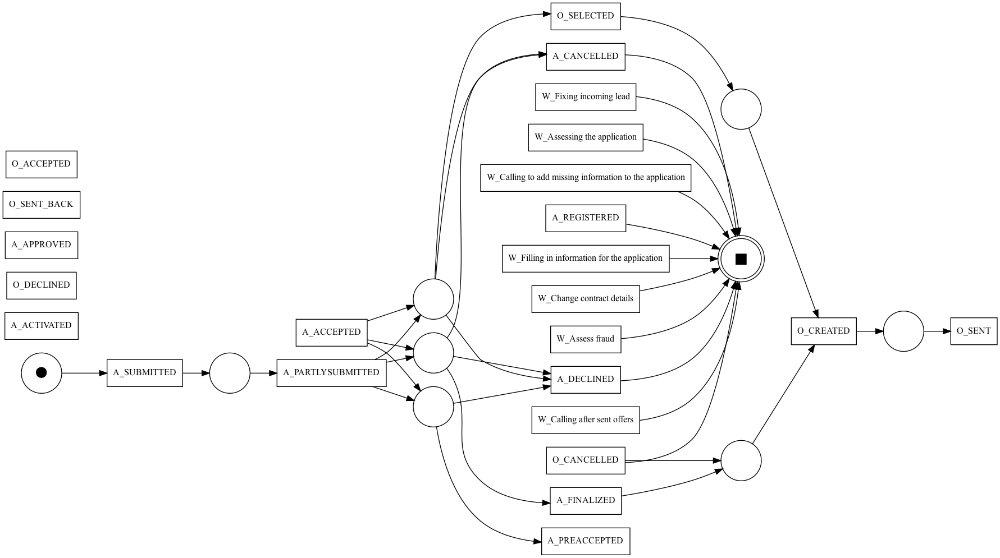

In [330]:
# Applying Alpha Miner Discovery Algorithm and visualising the process model

net, im, fm = alpha_miner.apply(event_log_xes)

gviz = pn_visualizer.apply(net, im, fm, log=event_log_xes)
pn_visualizer.view(gviz)

### Discovery of Overall Loan Process- Inductive Miner

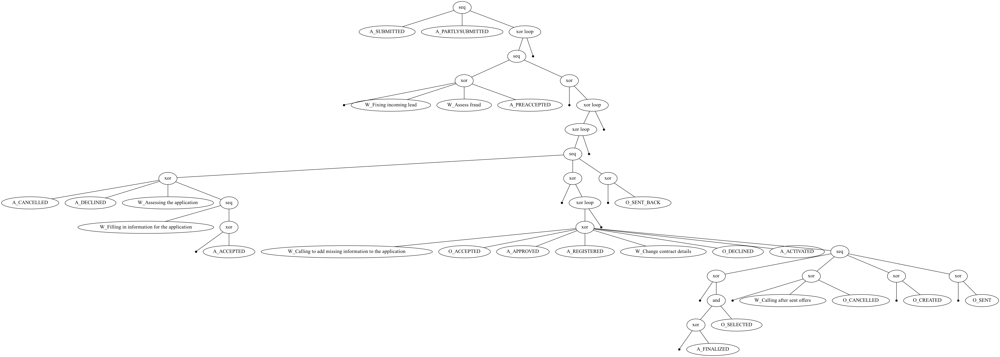

In [331]:
# Applying Inductive Miner Discovery Algorithm and visualising the process model using process tree

loan_process_tree = inductive_miner.apply_tree(event_log_xes)

gviz = pt_visualizer.apply(loan_process_tree, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz)

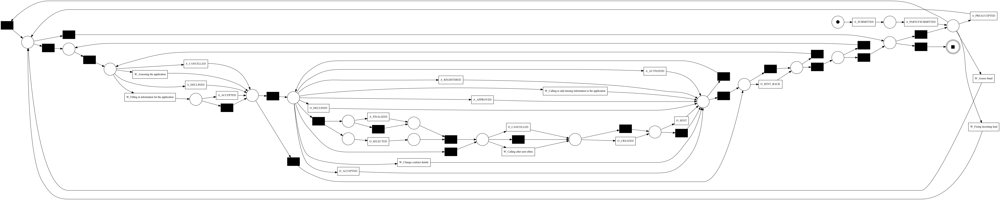

In [332]:
# Converting the Process Tree to Petri-net

net1, im1, fm1 = pt_converter.apply(loan_process_tree)
gviz = pn_visualizer.apply(net1, im1, fm1,
                           log=event_log_xes,parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pn_visualizer.view(gviz)

### Discovery of Overall Loan Process- Direct Flow Graphs (DFG) Miner


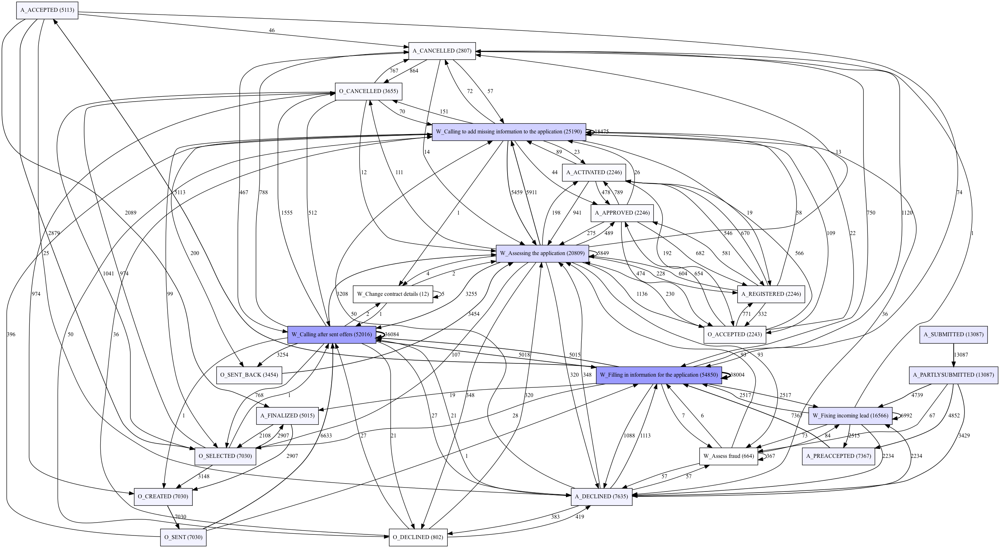

In [333]:
loan_process_dfg = dfg_discovery.apply(event_log_xes)

gviz = dfg_visualization.apply(loan_process_dfg, log=event_log_xes, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

### Discovery of Overall Loan Process- Heuristic Miner


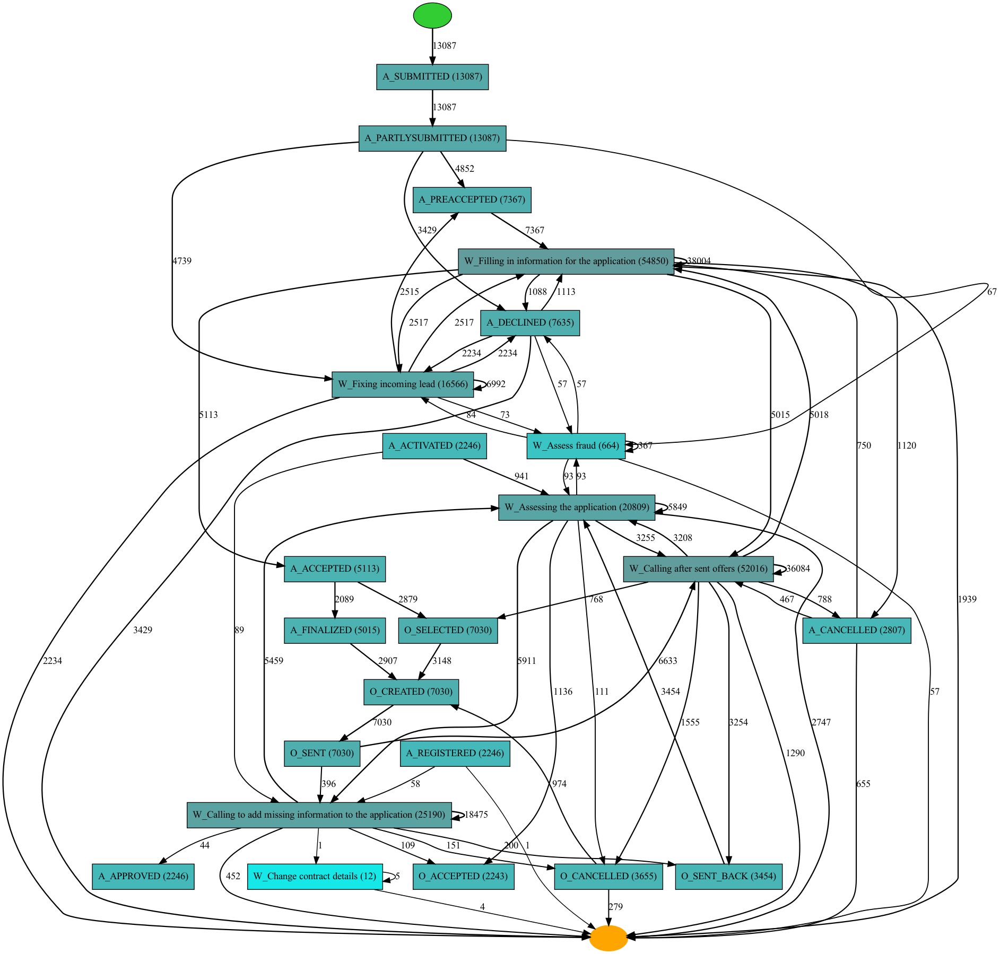

In [334]:
loan_heu = heuristics_miner.apply_heu(event_log_xes)

gviz = hn_visualizer.apply(loan_heu)
hn_visualizer.view(gviz)

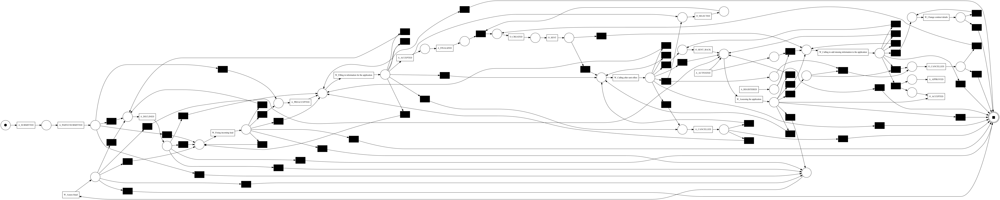

In [335]:
# Visualising Heuristic Minder as Petri Net

net2, im2, fm2= heuristics_miner.apply(event_log_xes)

gviz = pn_visualizer.apply(net2, im2, fm2, log=event_log_xes)
pn_visualizer.view(gviz)

 ### Discovery of Application Status- Alpha Miner

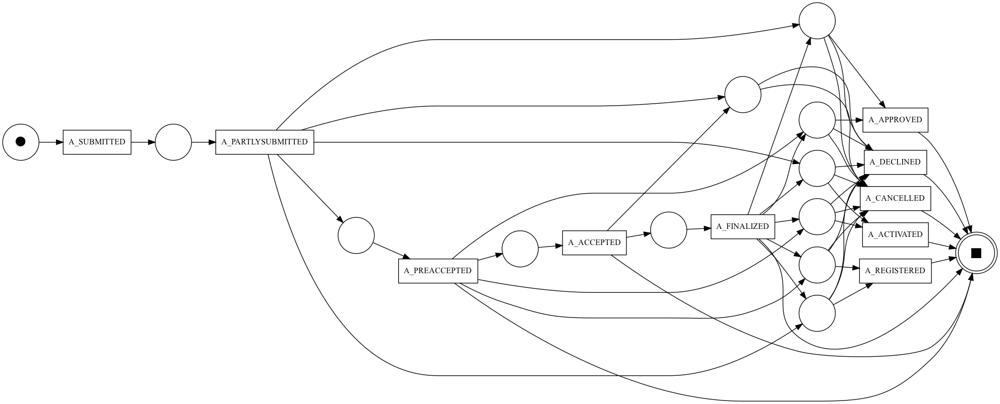

In [336]:
# Applying Alpha Miner Discovery Algorithm and visualising the process model

net3, im3, fm3 = alpha_miner.apply(app_status_log)

gviz = pn_visualizer.apply(net3, im3, fm3, log=app_status_log)
pn_visualizer.view(gviz)


### Discovery of Application Status - Inductive Miner

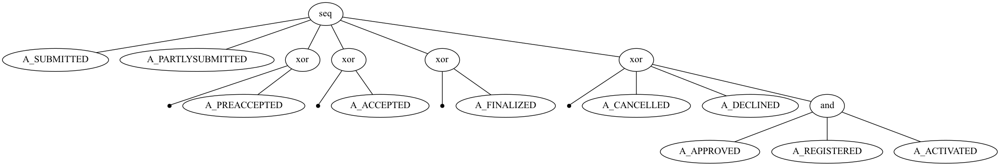

In [337]:
# Applying Inductive Miner Discovery Algorithm and visualising the process model using process tree

app_status_process_tree = inductive_miner.apply_tree(app_status_log)

gviz = pt_visualizer.apply(app_status_process_tree, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz)


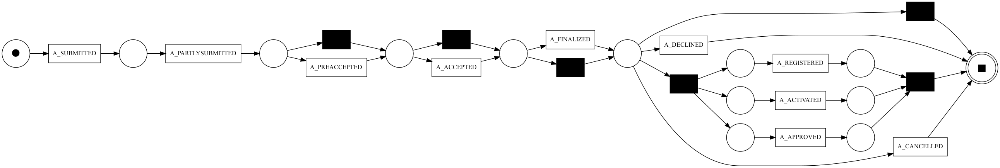

In [338]:
# Converting the Process Tree to Petri-net

net4, im4, fm4 = pt_converter.apply(app_status_process_tree)
gviz = pn_visualizer.apply(net4, im4, fm4,
                           log=app_status_log,parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pn_visualizer.view(gviz)



### Discovery of Application Status - Direct Flow Graphs (DFG) Miner

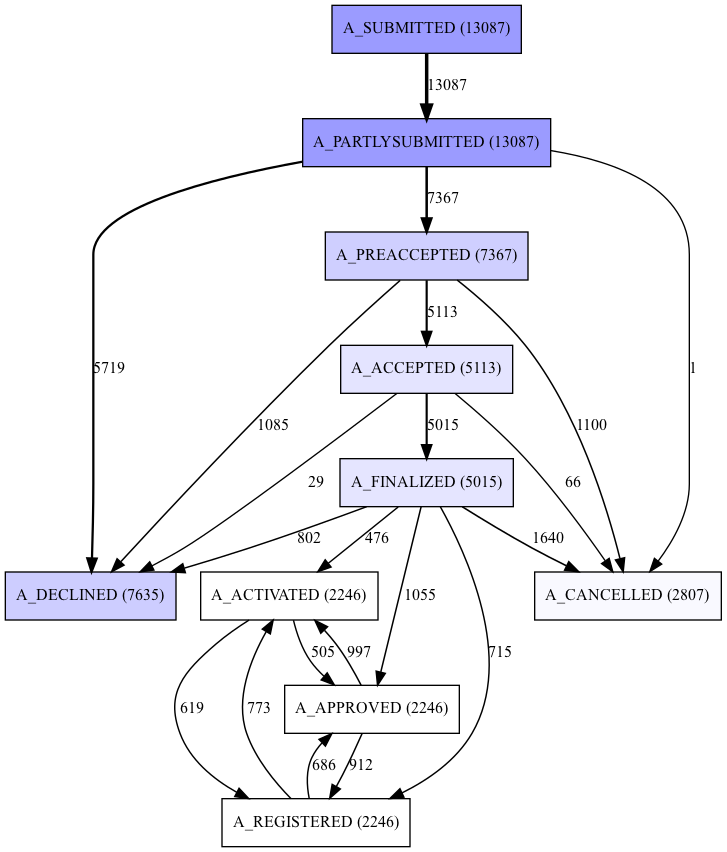

In [339]:
app_status_process_dfg = dfg_discovery.apply(app_status_log)

gviz = dfg_visualization.apply(app_status_process_dfg, log=app_status_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)


### Discovery of Application Status - Heuristic Miner

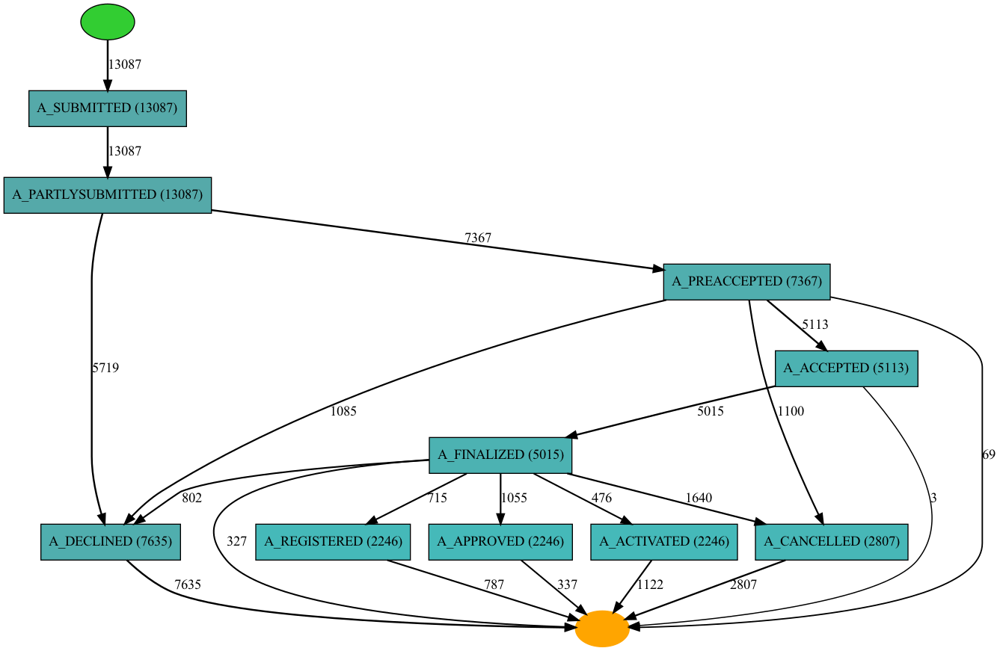

In [340]:
app_status_heu = heuristics_miner.apply_heu(app_status_log)

gviz = hn_visualizer.apply(app_status_heu)
hn_visualizer.view(gviz)


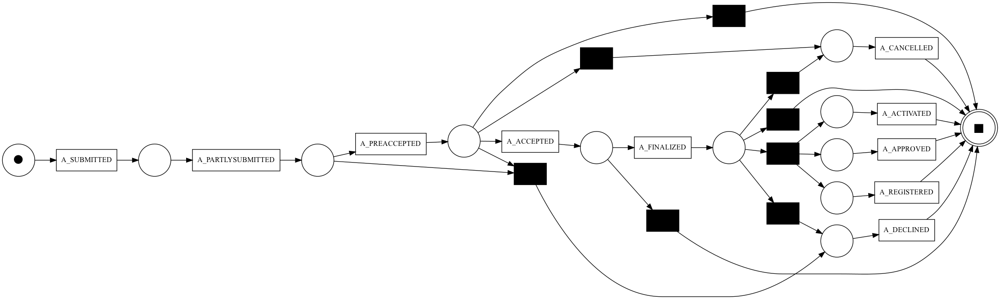

In [341]:

# Visualising Heuristic Minder as Petri Net

net5, im5, fm5= heuristics_miner.apply(app_status_log)

gviz = pn_visualizer.apply(net5, im5, fm5, log=app_status_log)
pn_visualizer.view(gviz)


### Discovery of Offer Status- Alpha Miner

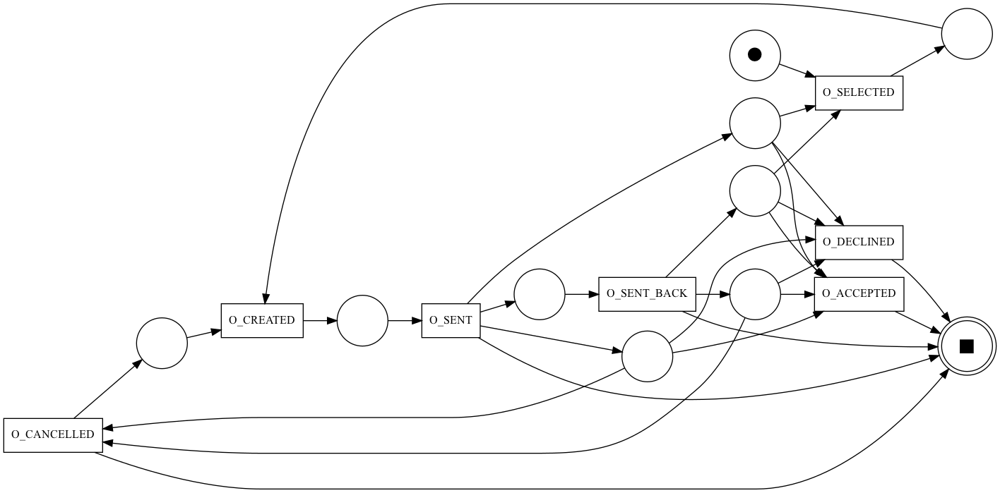

In [342]:
# Applying Alpha Miner Discovery Algorithm and visualising the process model

net6, im6, fm6 = alpha_miner.apply(offer_status_log)

gviz = pn_visualizer.apply(net6, im6, fm6, log=offer_status_log)
pn_visualizer.view(gviz)


### Discovery of Offer Status - Inductive Miner

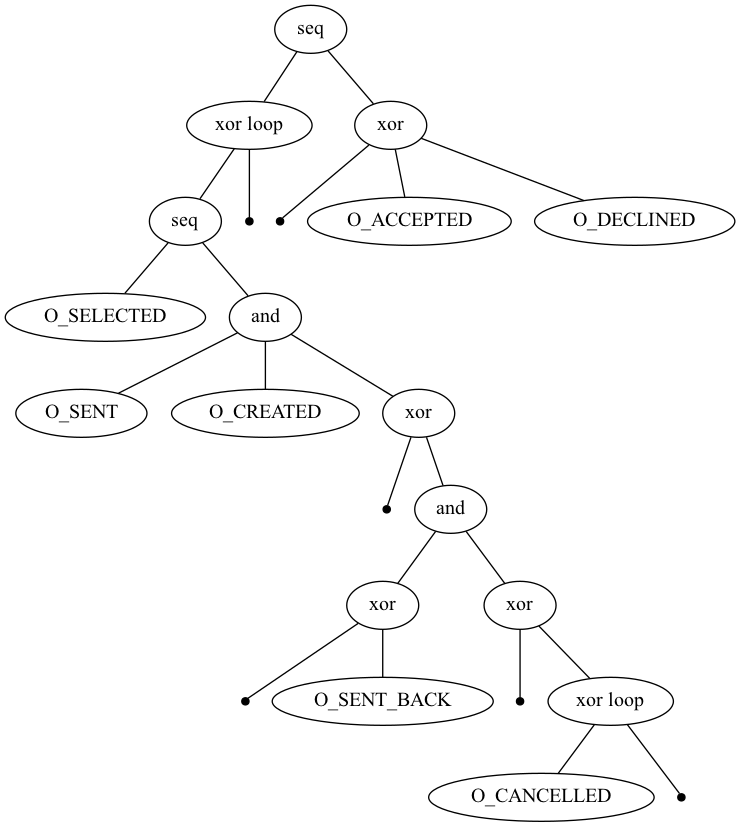

In [343]:
# Applying Inductive Miner Discovery Algorithm and visualising the process model using process tree

offer_status_process_tree = inductive_miner.apply_tree(offer_status_log)

gviz = pt_visualizer.apply(offer_status_process_tree, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz)


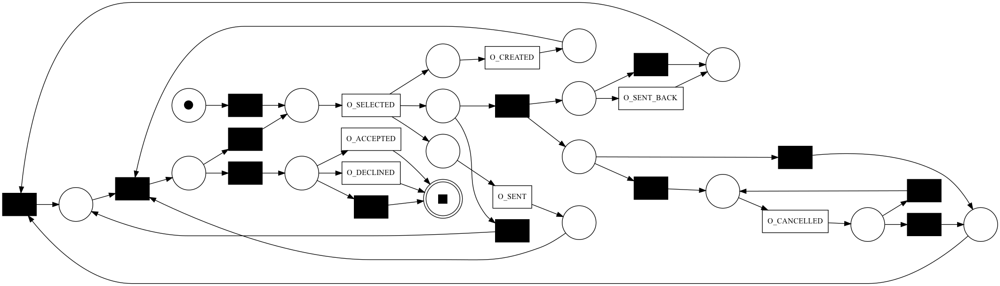

In [344]:
# Converting the Process Tree to Petri-net

net7, im7, fm7 = pt_converter.apply(offer_status_process_tree)
gviz = pn_visualizer.apply(net7, im7, fm7,
                           log=offer_status_log,parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pn_visualizer.view(gviz)


### Discovery of Offer Status - Direct Flow Graphs (DFG) Miner

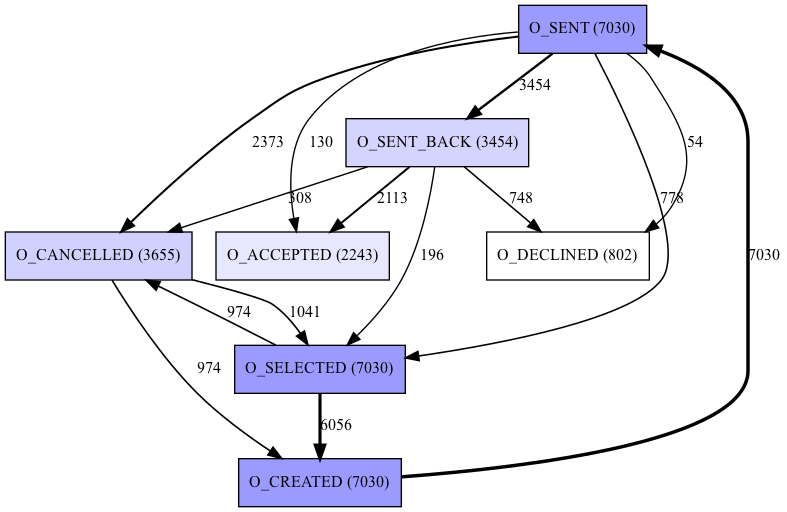

In [345]:
offer_status_process_dfg = dfg_discovery.apply(offer_status_log)

gviz = dfg_visualization.apply(offer_status_process_dfg, log=offer_status_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)


### Discovery of Offer Status - Heuristic Miner

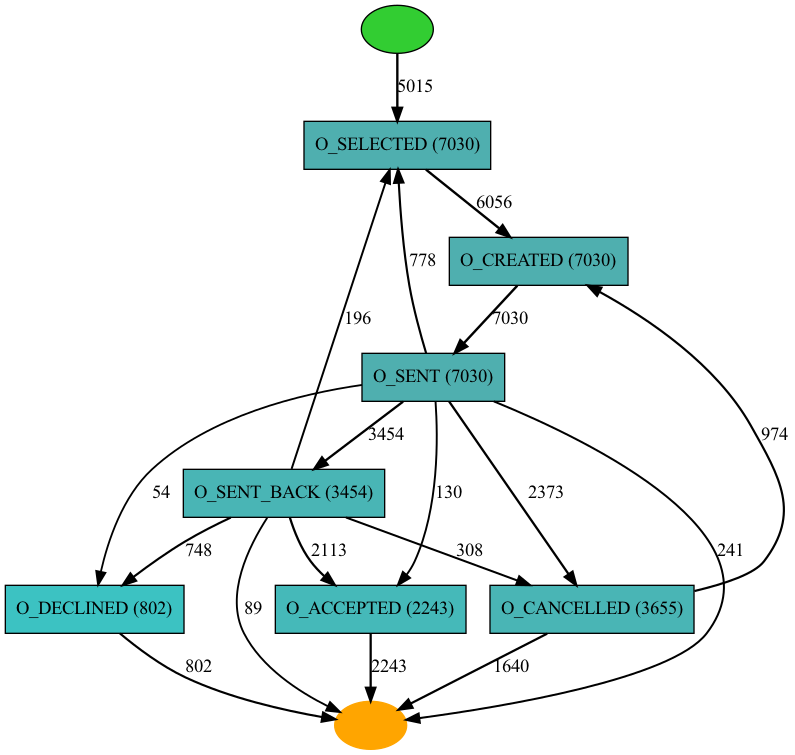

In [346]:
offer_status_heu = heuristics_miner.apply_heu(offer_status_log)

gviz = hn_visualizer.apply(offer_status_heu)
hn_visualizer.view(gviz)


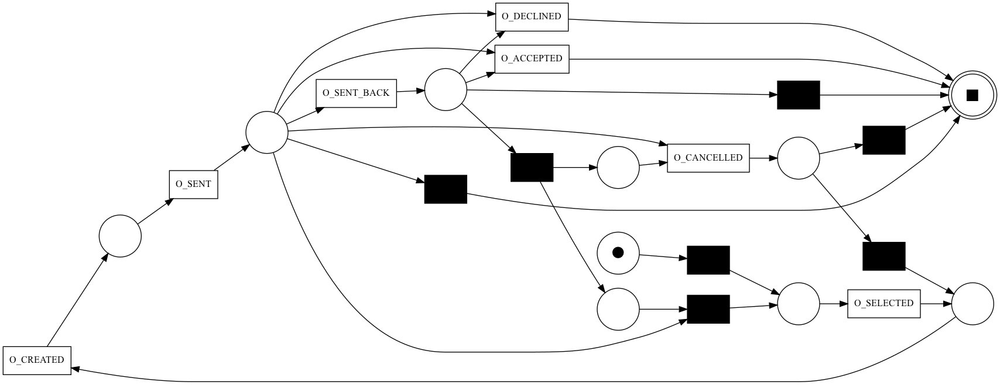

In [347]:
# Visualising Heuristic Minder as Petri Net

net8, im8, fm8= heuristics_miner.apply(offer_status_log)

gviz = pn_visualizer.apply(net8, im8, fm8, log=offer_status_log)
pn_visualizer.view(gviz)


### Discovery of Workitem Status- Alpha Miner

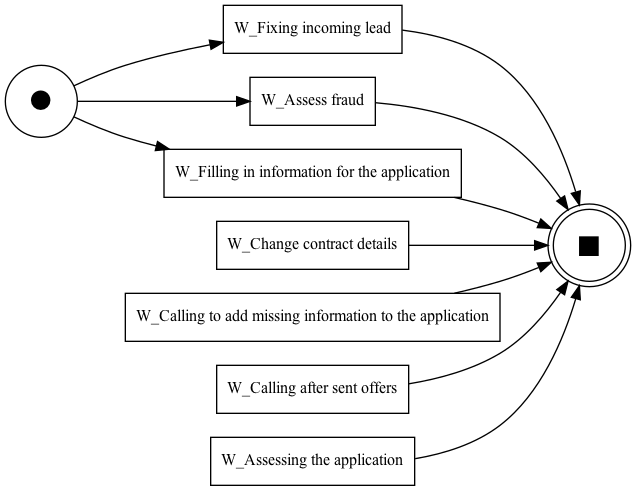

In [348]:
# Applying Alpha Miner Discovery Algorithm and visualising the process model

net9, im9, fm9 = alpha_miner.apply(workitem_status_log)

gviz = pn_visualizer.apply(net9, im9, fm9, log=workitem_status_log)
pn_visualizer.view(gviz)


### Discovery of Workitem Status - Inductive Miner

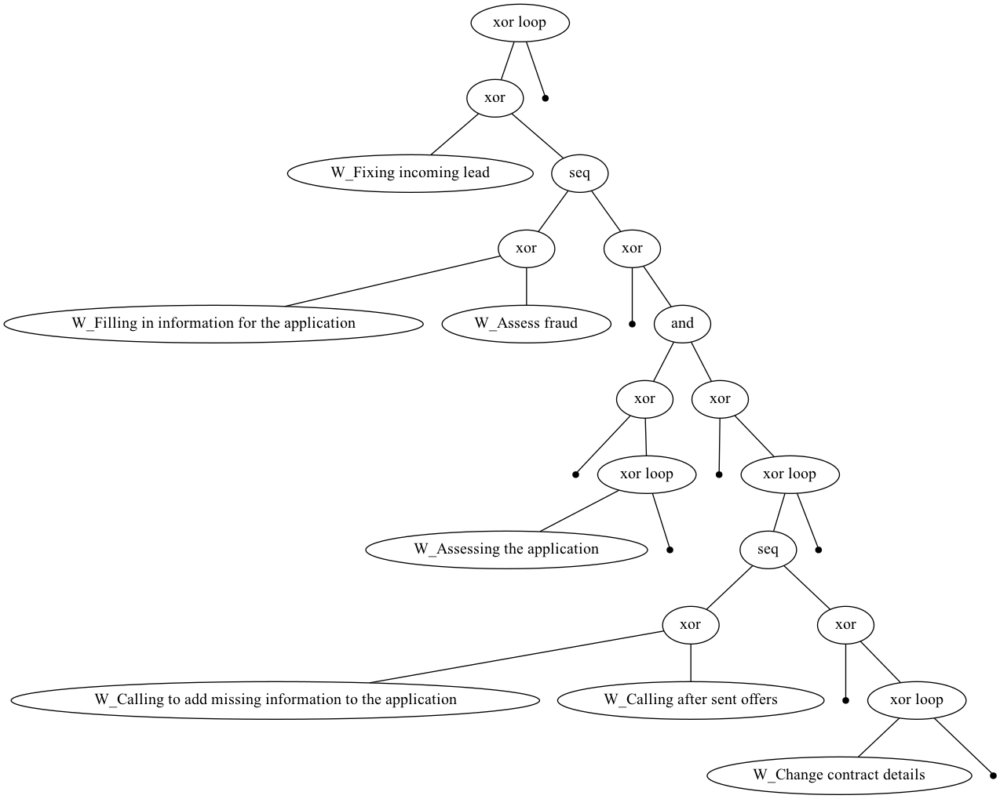

In [349]:
# Applying Inductive Miner Discovery Algorithm and visualising the process model using process tree

workitem_status_process_tree = inductive_miner.apply_tree(workitem_status_log)

gviz = pt_visualizer.apply(workitem_status_process_tree, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz)


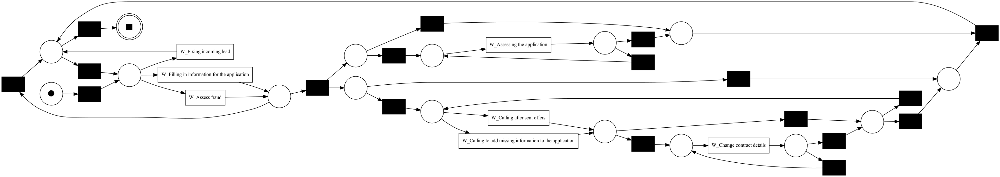

In [350]:
# Converting the Process Tree to Petri-net

net10, im10, fm10 = pt_converter.apply(workitem_status_process_tree)
gviz = pn_visualizer.apply(net10, im10, fm10,
                           log=workitem_status_log,parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pn_visualizer.view(gviz)


### Discovery of Workitem Status - Direct Flow Graphs (DFG) Miner

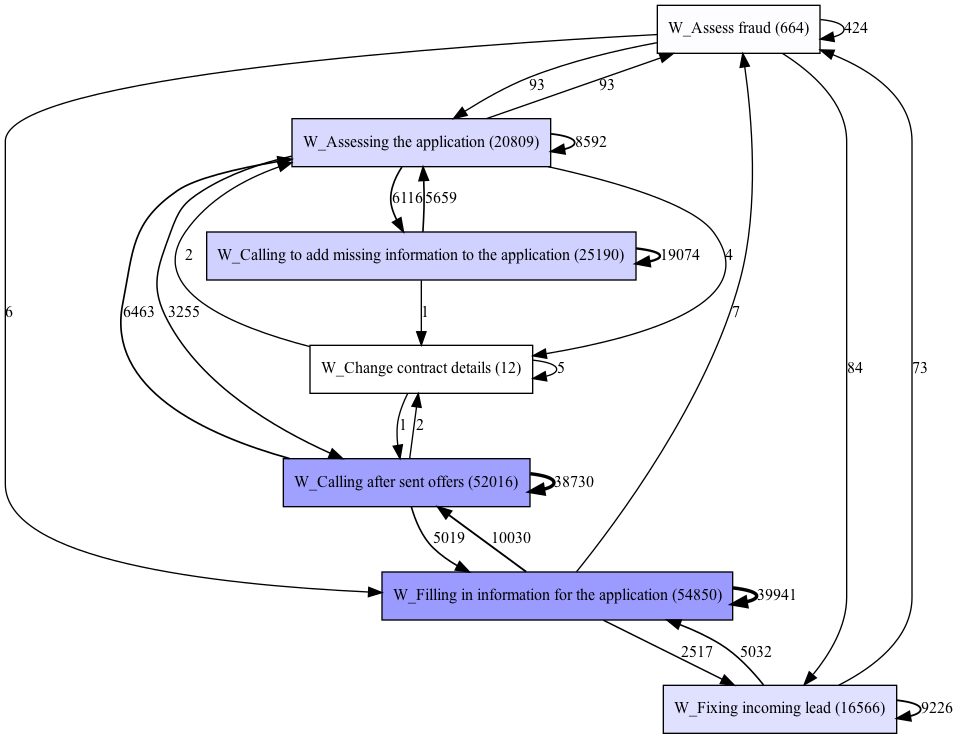

In [351]:
workitem_status_process_dfg = dfg_discovery.apply(workitem_status_log)

gviz = dfg_visualization.apply(workitem_status_process_dfg, log=workitem_status_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)


### Discovery of Workitem Status - Heuristic Miner

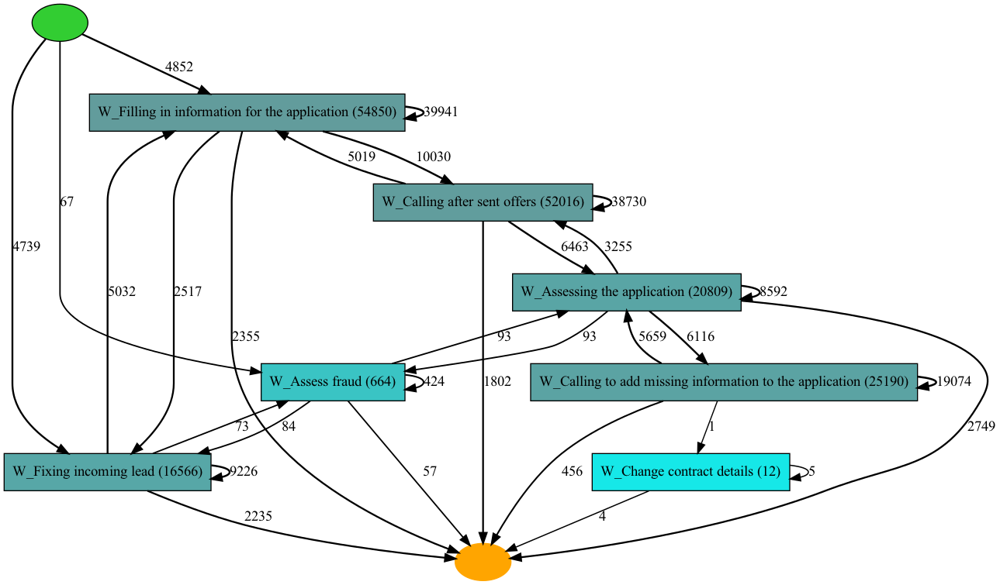

In [352]:
workitem_status_heu = heuristics_miner.apply_heu(workitem_status_log)

gviz = hn_visualizer.apply(workitem_status_heu)
hn_visualizer.view(gviz)



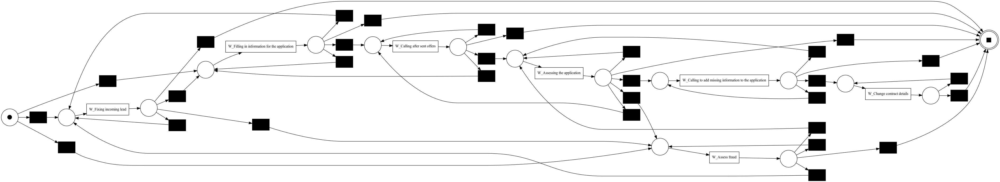

In [353]:
# Visualising Heuristic Minder as Petri Net

net11, im11, fm11= heuristics_miner.apply(workitem_status_log)

gviz = pn_visualizer.apply(net11, im11, fm11, log=workitem_status_log)
pn_visualizer.view(gviz)


## Performing Conformance Techniques
### Conformance of Overall Loan Process- Alpha Miner

In [354]:
# Checking for Fitness, Precision, Generalisation and Simplicity

overall_loan_alpha_fitness_score = replay_fitness_evaluator.apply(event_log_xes, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

overall_loan_alpha_precision_score = precision_evaluator.apply(event_log_xes, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

overall_loan_alpha_generalisation_score = generalization_evaluator.apply(event_log_xes, net, im, fm)

overall_loan_alpha_simplicity_score = simplicity_evaluator.apply(net)

print("Overall Loan Process Fitness score in Alpha miner is :",overall_loan_alpha_fitness_score)
print("Overall Loan Process Precision score in Alpha miner is :",overall_loan_alpha_precision_score)
print("Overall Loan Process Generalisation score in Alpha miner is :",overall_loan_alpha_generalisation_score)
print("Overall Loan Process Simplicity score in Alpha miner is :",overall_loan_alpha_simplicity_score)

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/56841 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

Overall Loan Process Fitness score in Alpha miner is : {'perc_fit_traces': 26.201574081149232, 'average_trace_fitness': 0.7740392525788016, 'log_fitness': 0.6722947077240501, 'percentage_of_fitting_traces': 26.201574081149232}
Overall Loan Process Precision score in Alpha miner is : 0.10239724412318274
Overall Loan Process Generalisation score in Alpha miner is : 0.9735932409545103
Overall Loan Process Simplicity score in Alpha miner is : 0.891891891891892


### Conformance of Application Status- Alpha Miner

In [355]:
# Checking for Fitness, Precision, Generalisation and Simplicity

app_status_alpha_fitness_score = replay_fitness_evaluator.apply(app_status_log, net3, im3, fm3, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

app_status_alpha_precision_score = precision_evaluator.apply(app_status_log, net3, im3, fm3, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

app_status_alpha_generalisation_score = generalization_evaluator.apply(app_status_log, net3, im3, fm3)

app_status_alpha_simplicity_score = simplicity_evaluator.apply(net3)

print("Application Status Process Fitness score in Alpha miner is :",app_status_alpha_fitness_score)
print("Application Status Process Precision score in Alpha miner is :",app_status_alpha_precision_score)
print("Application Status Process Generalisation score in Alpha miner is :",app_status_alpha_generalisation_score)
print("Application Status Process Simplicity score in Alpha miner is :",app_status_alpha_simplicity_score)


replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

Application Status Process Fitness score in Alpha miner is : {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.7972651807745887, 'log_fitness': 0.761876888688735, 'percentage_of_fitting_traces': 0.0}
Application Status Process Precision score in Alpha miner is : 0.6682768515559899
Application Status Process Generalisation score in Alpha miner is : 0.9849139556688847
Application Status Process Simplicity score in Alpha miner is : 0.2911392405063291


### Conformance of Offer Status Process- Alpha Miner

In [356]:
# Checking for Fitness, Precision, Generalisation and Simplicity

offer_status_alpha_fitness_score = replay_fitness_evaluator.apply(offer_status_log, net6, im6, fm6, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

offer_status_alpha_precision_score = precision_evaluator.apply(offer_status_log, net6, im6, fm6, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

offer_status_alpha_generalisation_score = generalization_evaluator.apply(offer_status_log, net6, im6, fm6)

offer_status_alpha_simplicity_score = simplicity_evaluator.apply(net6)

print("Offer Status Process Fitness score in Alpha miner is :",offer_status_alpha_fitness_score)
print("Offer Status Process Precision score in Alpha miner is :",offer_status_alpha_precision_score)
print("Offer Status Process Generalisation score in Alpha miner is :",offer_status_alpha_generalisation_score)
print("Offer Status Process Simplicity score in Alpha miner is :",offer_status_alpha_simplicity_score)


replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/411 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

Offer Status Process Fitness score in Alpha miner is : {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.6890303174678584, 'log_fitness': 0.6943154596373059, 'percentage_of_fitting_traces': 0.0}
Offer Status Process Precision score in Alpha miner is : 1.0
Offer Status Process Generalisation score in Alpha miner is : 0.9820339600726753
Offer Status Process Simplicity score in Alpha miner is : 0.39534883720930236


### Conformance of Workitem Status Process- Alpha Miner

In [357]:
# Checking for Fitness, Precision, Generalisation and Simplicity

workitem_status_alpha_fitness_score = replay_fitness_evaluator.apply(workitem_status_log, net9, im9, fm9, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

workitem_status_alpha_precision_score = precision_evaluator.apply(workitem_status_log, net9, im9, fm9, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

workitem_status_alpha_generalisation_score = generalization_evaluator.apply(workitem_status_log, net9, im9, fm9)

workitem_status_alpha_simplicity_score = simplicity_evaluator.apply(net9)

print("Workitem Status Process Fitness score in Alpha miner is :",workitem_status_alpha_fitness_score)
print("Workitem Status Process Precision score in Alpha miner is :",workitem_status_alpha_precision_score)
print("Workitem Status Process Generalisation score in Alpha miner is :",workitem_status_alpha_generalisation_score)
print("Workitem Status Process Simplicity score in Alpha miner is :",workitem_status_alpha_simplicity_score)


replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/26423 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

Workitem Status Process Fitness score in Alpha miner is : {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.27484851486754003, 'log_fitness': 0.17188371451728185, 'percentage_of_fitting_traces': 0.0}
Workitem Status Process Precision score in Alpha miner is : 0.2727272727272727
Workitem Status Process Generalisation score in Alpha miner is : 0.9489800722443816
Workitem Status Process Simplicity score in Alpha miner is : 0.8181818181818181


### Conformance of Overall Loan Process- Inductive Miner

In [358]:
# Checking for Fitness, Precision, Generalisation and Simplicity

overall_loan_inductive_fitness_score = replay_fitness_evaluator.apply(event_log_xes, net1, im1, fm1, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

overall_loan_inductive_precision_score = precision_evaluator.apply(event_log_xes, net1, im1, fm1, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

overall_loan_inductive_generalisation_score = generalization_evaluator.apply(event_log_xes, net1, im1, fm1)

overall_loan_inductive_simplicity_score = simplicity_evaluator.apply(net1)


print("Overall Loan Process Fitness score in Inductive miner is :",overall_loan_inductive_fitness_score)
print("Overall Loan Process Precision score in Inductive miner is :",overall_loan_inductive_precision_score)
print("Overall Loan Process Generalisation score in Inductive miner is :",overall_loan_inductive_generalisation_score)
print("Overall Loan Process Simplicity score in Inductive miner is :",overall_loan_inductive_simplicity_score)



replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/56841 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

Overall Loan Process Fitness score in Inductive miner is : {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
Overall Loan Process Precision score in Inductive miner is : 0.11614605584800297
Overall Loan Process Generalisation score in Inductive miner is : 0.9614268998755126
Overall Loan Process Simplicity score in Inductive miner is : 0.5609756097560976


### Conformance of Apllication Status Process- Inductive Miner

In [359]:
# Checking for Fitness, Precision, Generalisation and Simplicity

app_status_inductive_fitness_score = replay_fitness_evaluator.apply(app_status_log, net4, im4, fm4, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

app_status_inductive_precision_score = precision_evaluator.apply(app_status_log, net4, im4, fm4, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

app_status_inductive_generalisation_score = generalization_evaluator.apply(app_status_log, net4, im4, fm4)

app_status_inductive_simplicity_score = simplicity_evaluator.apply(net4)


print("Application Status Process Fitness score in Inductive miner is :",app_status_inductive_fitness_score)
print("Application Status Process Precision score in Inductive miner is :",app_status_inductive_precision_score)
print("Application Status Process Generalisation score in Inductive miner is :",app_status_inductive_generalisation_score)
print("Application Status Process Simplicity score in Inductive miner is :",app_status_inductive_simplicity_score)



replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

Application Status Process Fitness score in Inductive miner is : {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
Application Status Process Precision score in Inductive miner is : 0.5471181330675388
Application Status Process Generalisation score in Inductive miner is : 0.9825827902072926
Application Status Process Simplicity score in Inductive miner is : 0.6744186046511628


### Conformance of Offer Status Process- Inductive Miner

In [360]:
# Checking for Fitness, Precision, Generalisation and Simplicity

offer_status_inductive_fitness_score = replay_fitness_evaluator.apply(offer_status_log, net7, im7, fm7, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

offer_status_inductive_precision_score = precision_evaluator.apply(offer_status_log, net7, im7, fm7, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

offer_status_inductive_generalisation_score = generalization_evaluator.apply(offer_status_log, net7, im7, fm7)

offer_status_inductive_simplicity_score = simplicity_evaluator.apply(net7)


print("Offer Status Process Fitness score in Inductive miner is :",offer_status_inductive_fitness_score)
print("Offer Status Process Precision score in Inductive miner is :",offer_status_inductive_precision_score)
print("Offer Status Process Generalisation score in Inductive miner is :",offer_status_inductive_generalisation_score)
print("Offer Status Process Simplicity score in Inductive miner is :",offer_status_inductive_simplicity_score)



replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/411 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

Offer Status Process Fitness score in Inductive miner is : {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
Offer Status Process Precision score in Inductive miner is : 0.5520943568592336
Offer Status Process Generalisation score in Inductive miner is : 0.9802372449160853
Offer Status Process Simplicity score in Inductive miner is : 0.6727272727272727


### Conformance of Workitem Status Process- Inductive Miner

In [361]:
# Checking for Fitness, Precision, Generalisation and Simplicity

workitem_status_inductive_fitness_score = replay_fitness_evaluator.apply(workitem_status_log, net10, im10, fm10, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

workitem_status_inductive_precision_score = precision_evaluator.apply(workitem_status_log, net10, im10, fm10, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

workitem_status_inductive_generalisation_score = generalization_evaluator.apply(workitem_status_log, net10, im10, fm10)

workitem_status_inductive_simplicity_score = simplicity_evaluator.apply(net10)


print("WorkItem Status Process Fitness score in Inductive miner is :",workitem_status_inductive_fitness_score)
print("WorkItem Status Process Precision score in Inductive miner is :",workitem_status_inductive_precision_score)
print("WorkItem Status Process Generalisation score in Inductive miner is :",workitem_status_inductive_generalisation_score)
print("WorkItem Status Process Simplicity score in Inductive miner is :",workitem_status_inductive_simplicity_score)



replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/26423 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

WorkItem Status Process Fitness score in Inductive miner is : {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
WorkItem Status Process Precision score in Inductive miner is : 0.2969224995725386
WorkItem Status Process Generalisation score in Inductive miner is : 0.9276499337720443
WorkItem Status Process Simplicity score in Inductive miner is : 0.6507936507936508


### Conformance of Overall Loan Process- Heuristic Miner

In [362]:
# Checking for Fitness, Precision, Generalisation and Simplicity

overall_loan_heuristic_fitness_score = replay_fitness_evaluator.apply(event_log_xes, net2, im2, fm2, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

overall_loan_heuristic_precision_score = precision_evaluator.apply(event_log_xes, net2, im2, fm2, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

overall_loan_heuristic_generalisation_score = generalization_evaluator.apply(event_log_xes, net2, im2, fm2)

overall_loan_heuristic_simplicity_score = simplicity_evaluator.apply(net2)

print("Overall loan Process Fitness score in Heuristic miner is :",overall_loan_heuristic_fitness_score)
print("Overall loan Process Precision score in Heuristic miner is :",overall_loan_heuristic_precision_score)
print("Overall loan Process Generalisation score in Heuristic miner is :",overall_loan_heuristic_generalisation_score)
print("Overall loan Process Simplicity score in Heuristic miner is :",overall_loan_heuristic_simplicity_score)




replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/56841 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

Overall loan Process Fitness score in Heuristic miner is : {'perc_fit_traces': 62.51241690226943, 'average_trace_fitness': 0.9866465763520144, 'log_fitness': 0.977074974341505, 'percentage_of_fitting_traces': 62.51241690226943}
Overall loan Process Precision score in Heuristic miner is : 0.31220890274300683
Overall loan Process Generalisation score in Heuristic miner is : 0.926875573892439
Overall loan Process Simplicity score in Heuristic miner is : 0.5607476635514019


### Conformance of Application Status Process- Heuristic Miner

In [363]:
# Checking for Fitness, Precision, Generalisation and Simplicity

app_status_heuristic_fitness_score = replay_fitness_evaluator.apply(app_status_log, net5, im5, fm5, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

app_status_heuristic_precision_score = precision_evaluator.apply(app_status_log, net5, im5, fm5, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

app_status_heuristic_generalisation_score = generalization_evaluator.apply(app_status_log, net5, im5, fm5)

app_status_heuristic_simplicity_score = simplicity_evaluator.apply(net5)

print("Application Status Process Fitness score in Heuristic miner is :",app_status_heuristic_fitness_score)
print("Application Status Process Precision score in Heuristic miner is :",app_status_heuristic_precision_score)
print("Application Status Process Generalisation score in Heuristic miner is :",app_status_heuristic_generalisation_score)
print("Application Status Process Simplicity score in Heuristic miner is :",app_status_heuristic_simplicity_score)




replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

Application Status Process Fitness score in Heuristic miner is : {'perc_fit_traces': 30.113853442347366, 'average_trace_fitness': 0.8586383433941921, 'log_fitness': 0.8896245332793149, 'percentage_of_fitting_traces': 30.113853442347366}
Application Status Process Precision score in Heuristic miner is : 1.0
Application Status Process Generalisation score in Heuristic miner is : 0.8880470605881805
Application Status Process Simplicity score in Heuristic miner is : 0.625


### Conformance of Offer Status Process- Heuristic Miner

In [364]:
# Checking for Fitness, Precision, Generalisation and Simplicity

offer_status_heuristic_fitness_score = replay_fitness_evaluator.apply(offer_status_log, net8, im8, fm8, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

offer_status_heuristic_precision_score = precision_evaluator.apply(offer_status_log, net8, im8, fm8, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

offer_status_heuristic_generalisation_score = generalization_evaluator.apply(offer_status_log, net8, im8, fm8)

offer_status_heuristic_simplicity_score = simplicity_evaluator.apply(net8)

print("Offer Status Process Fitness score in Heuristic miner is :",offer_status_heuristic_fitness_score)
print("Offer Status Process Precision score in Heuristic miner is :",offer_status_heuristic_precision_score)
print("Offer Status Process Generalisation score in Heuristic miner is :",offer_status_heuristic_generalisation_score)
print("Offer Status Process Simplicity score in Heuristic miner is :",offer_status_heuristic_simplicity_score)


replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/411 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/168 [00:00<?, ?it/s]

Offer Status Process Fitness score in Heuristic miner is : {'perc_fit_traces': 4.2073778664007975, 'average_trace_fitness': 0.9065316753058114, 'log_fitness': 0.8853002045069547, 'percentage_of_fitting_traces': 4.2073778664007975}
Offer Status Process Precision score in Heuristic miner is : 1.0
Offer Status Process Generalisation score in Heuristic miner is : 0.8748513033361021
Offer Status Process Simplicity score in Heuristic miner is : 0.5714285714285714


### Conformance of Work Item Status Process- Heuristic Miner

In [365]:
# Checking for Fitness, Precision, Generalisation and Simplicity

workitem_status_heuristic_fitness_score = replay_fitness_evaluator.apply(workitem_status_log, net11, im11, fm11, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)

workitem_status_heuristic_precision_score = precision_evaluator.apply(workitem_status_log, net11, im11, fm11, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

workitem_status_heuristic_generalisation_score = generalization_evaluator.apply(workitem_status_log, net11, im11, fm11)

workitem_status_heuristic_simplicity_score = simplicity_evaluator.apply(net11)

print("Workitem Status Process Fitness score in Heuristic miner is :",workitem_status_heuristic_fitness_score)
print("Workitem Status Process Precision score in Heuristic miner is :",workitem_status_heuristic_precision_score)
print("Workitem Status Process Generalisation score in Heuristic miner is :",workitem_status_heuristic_generalisation_score)
print("Workitem Status Process Simplicity score in Heuristic miner is :",workitem_status_heuristic_simplicity_score)



replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/26423 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2643 [00:00<?, ?it/s]

Workitem Status Process Fitness score in Heuristic miner is : {'perc_fit_traces': 99.9068130047629, 'average_trace_fitness': 0.9999859046760026, 'log_fitness': 0.9999749666917926, 'percentage_of_fitting_traces': 99.9068130047629}
Workitem Status Process Precision score in Heuristic miner is : 0.5111315690274723
Workitem Status Process Generalisation score in Heuristic miner is : 0.8958770898216252
Workitem Status Process Simplicity score in Heuristic miner is : 0.5578947368421053


## Performing Process Enhancement Techniques

In [366]:
# Applying process metrics/ statistics on top of the process models discovered

# Visualising the process models with Frequency and Performance Details


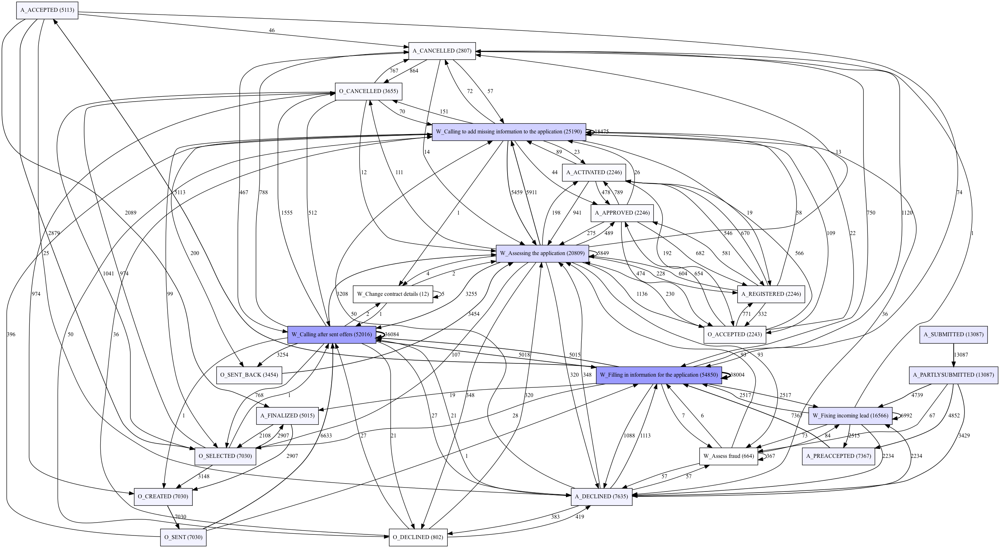

In [372]:

# for DFG- loan process overlaying frequency information from the log

gviz = dfg_visualization.apply(loan_process_dfg, log=event_log_xes, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)


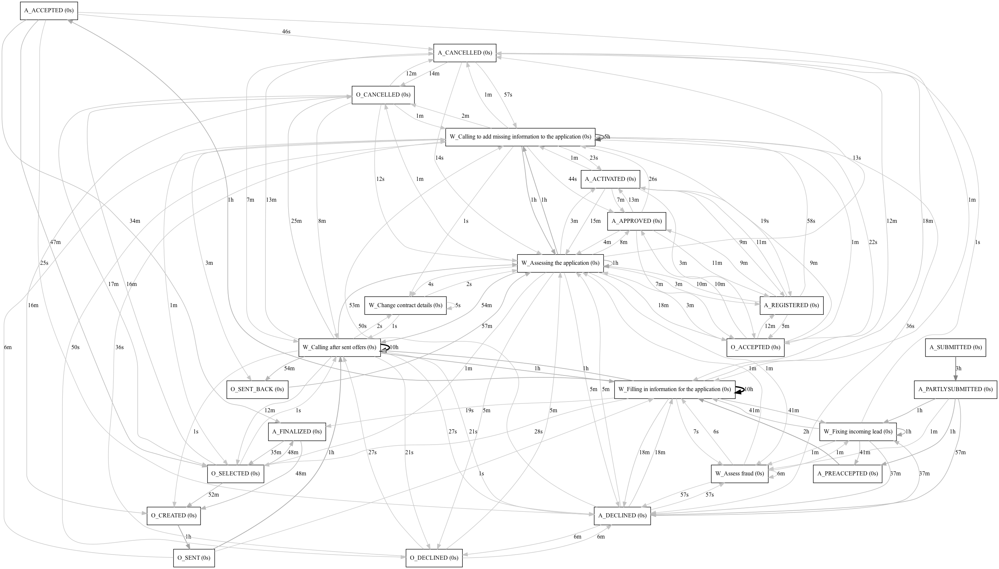

In [373]:

# for DFG- loan process overlaying Performance information from the log

gviz = dfg_visualization.apply(loan_process_dfg, log=event_log_xes, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

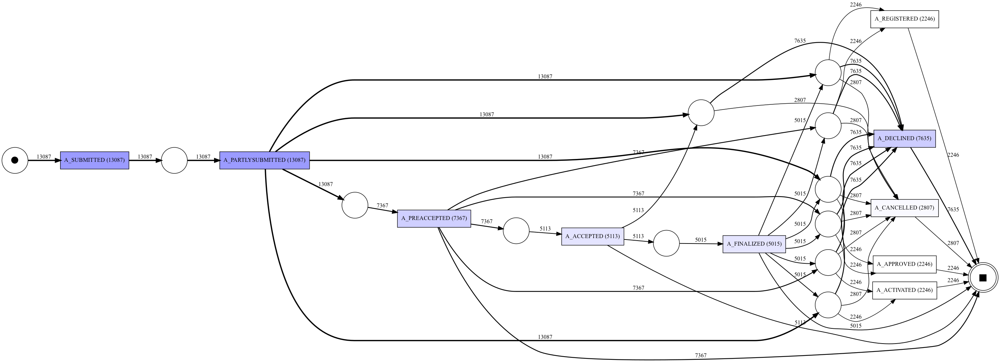

In [378]:
# for Alpha miner- Application Status process overlaying frequency information from the log


gviz = pn_visualizer.apply(net3, im3, fm3, variant=pn_visualizer.Variants.FREQUENCY, log=event_log_xes)
pn_visualizer.view(gviz)

replaying log with TBR, completed variants ::   0%|          | 0/4366 [00:00<?, ?it/s]

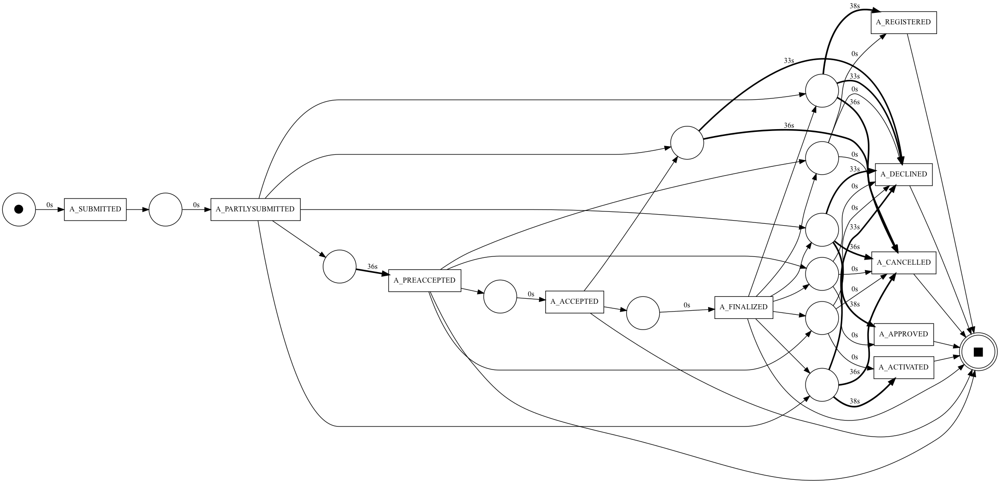

In [379]:
# for Alpha miner- Application Status process overlaying Performance information from the log


gviz = pn_visualizer.apply(net3, im3, fm3, variant=pn_visualizer.Variants.PERFORMANCE, log=event_log_xes)
pn_visualizer.view(gviz)


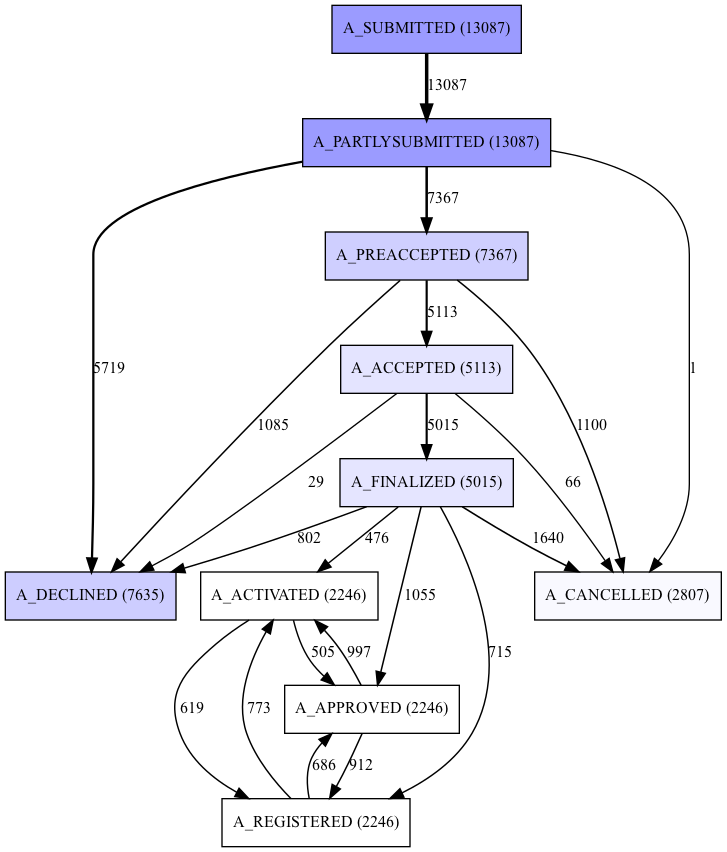

In [380]:
# for DFG- Application Status process overlaying frequency information from the log

gviz = dfg_visualization.apply(app_status_process_dfg, log=app_status_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)


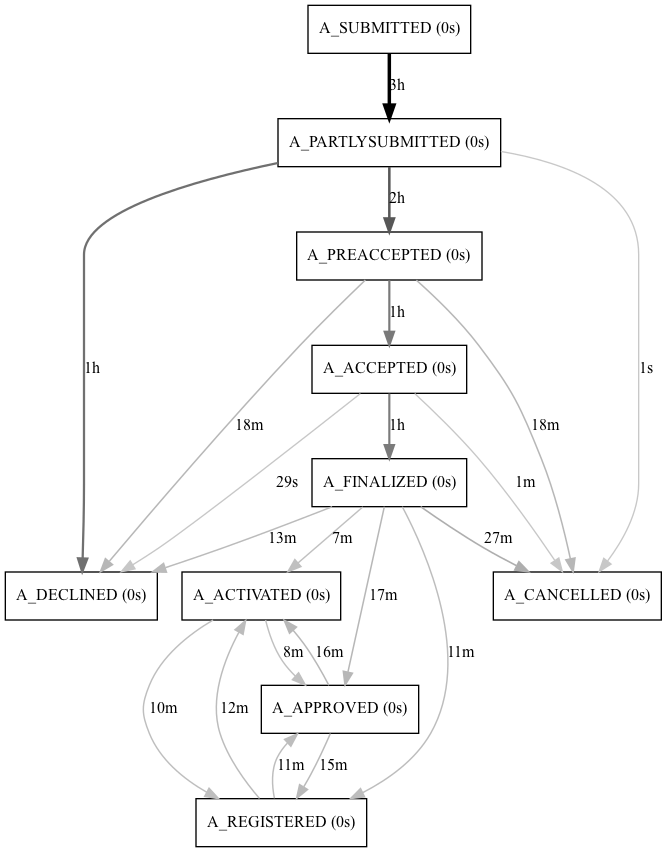

In [381]:
# for DFG- Application Status process overlaying Performance information from the log

gviz = dfg_visualization.apply(app_status_process_dfg, log=app_status_log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

In [413]:
all_case_durations = pm4py.get_all_case_durations(event_log_xes)
all_case_durations

[1.8549997806549072,
 1.8960001468658447,
 2.003000020980835,
 2.013000011444092,
 2.060999870300293,
 2.0880000591278076,
 2.0969998836517334,
 2.0969998836517334,
 2.11899995803833,
 2.138000011444092,
 2.1579999923706055,
 2.184000015258789,
 2.194000005722046,
 2.195000171661377,
 2.2130000591278076,
 2.2200000286102295,
 2.2789998054504395,
 2.323000192642212,
 2.3320000171661377,
 2.3369998931884766,
 2.3490002155303955,
 2.3530001640319824,
 2.381999969482422,
 2.3910000324249268,
 2.392000198364258,
 2.425999879837036,
 2.440000057220459,
 2.4579999446868896,
 2.4589998722076416,
 2.4800000190734863,
 2.4850001335144043,
 2.48799991607666,
 2.500999927520752,
 2.505000114440918,
 2.5160000324249268,
 2.5180001258850098,
 2.5329999923706055,
 2.574000120162964,
 2.578000068664551,
 2.5850000381469727,
 2.609999895095825,
 2.627000093460083,
 2.6379997730255127,
 2.680000066757202,
 2.684000015258789,
 2.69100022315979,
 2.697999954223633,
 2.705000162124634,
 2.7129998207092285,

In [414]:
rework = pm4py.get_rework_cases_per_activity(event_log_xes)
rework

{'W_Filling in information for the application': 7367,
 'W_Calling after sent offers': 5011,
 'W_Assessing the application': 3210,
 'O_SELECTED': 1438,
 'O_CREATED': 1438,
 'O_SENT': 1438,
 'O_CANCELLED': 749,
 'W_Fixing incoming lead': 4755,
 'W_Calling to add missing information to the application': 1647,
 'O_SENT_BACK': 197,
 'W_Assess fraud': 108,
 'W_Change contract details': 4}

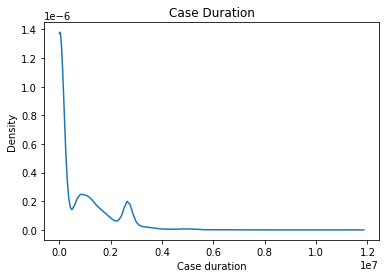

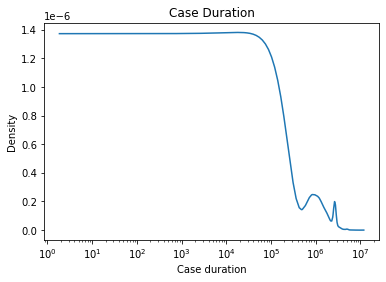

In [416]:
from pm4py.util import constants
from pm4py.statistics.traces.generic.log import case_statistics
x, y = case_statistics.get_kde_caseduration(event_log_xes, parameters={constants.PARAMETER_CONSTANT_TIMESTAMP_KEY: "time:timestamp"})

from pm4py.visualization.graphs import visualizer as graphs_visualizer

gviz = graphs_visualizer.apply_plot(x, y, variant=graphs_visualizer.Variants.CASES)
graphs_visualizer.view(gviz)

gviz = graphs_visualizer.apply_semilogx(x, y, variant=graphs_visualizer.Variants.CASES)
graphs_visualizer.view(gviz)
         


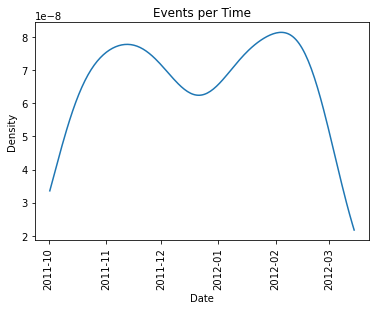

In [421]:

from pm4py.algo.filtering.log.attributes import attributes_filter

x, y = attributes_filter.get_kde_date_attribute(app_status_log, attribute="time:timestamp")

from pm4py.visualization.graphs import visualizer as graphs_visualizer

gviz = graphs_visualizer.apply_plot(x, y, variant=graphs_visualizer.Variants.DATES)
graphs_visualizer.view(gviz)
     